In [1]:
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import stlearn as st

/mnt/scratch1/miniconda3/envs/rsc_conda/lib/python3.10/site-packages/stlearn/tools/microenv/cci/het.py:192: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit(parallel=True, nopython=False)


In [2]:
adata = ad.read_h5ad('adata_clr.h5ad')
print(adata)
adata_sm = ad.read_h5ad('adata_clr_sm.h5ad')
print(adata_sm)

'''st.pp.scale(adata)
for sample in adata.obs['batch'].unique().tolist():
    for gene in adata[adata.obs['batch']==sample].var_names.tolist():
        adata[adata.obs['batch']==sample][:,gene].X = adata[adata.obs['batch']==sample][:,gene].X + abs(adata[adata.obs['batch']==sample][:,gene].X.min()) + 1e-10
'''
adata.obs['phenotype'] = adata_sm.obs['phenotype'].astype('category')
adata.obs.groupby('batch').phenotype.value_counts()

adata.write_h5ad('adata_clr.h5ad')

/home/lzhang36/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 8504503 × 65
    obs: 'imagecol', 'imagerow', 'cellSize', 'batch'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 8504503 × 65
    obs: 'imagecol', 'imagerow', 'cellSize', 'batch', 'phenotype'
    uns: 'gates'
    obsm: 'spatial'


         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/lzhang36/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/mnt/scratch1/miniconda3/envs/rsc_conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


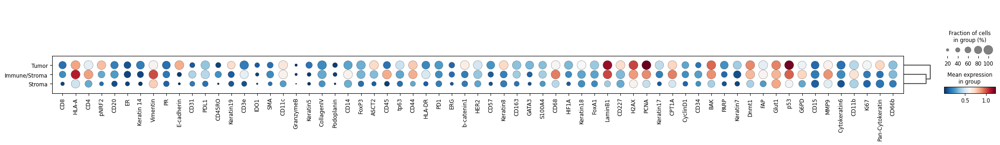

/mnt/scratch1/miniconda3/envs/rsc_conda/lib/python3.10/site-packages/scanpy/plotting/_utils.py:431: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/mnt/scratch1/miniconda3/envs/rsc_conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/scratch1/miniconda3/envs/rsc_conda/lib/python3.10/site-packages/scanpy/plotting/_utils.py:431: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/mnt/scratch1/miniconda3/envs/rsc_conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/scratch1/miniconda3/envs/rsc_conda/lib/python

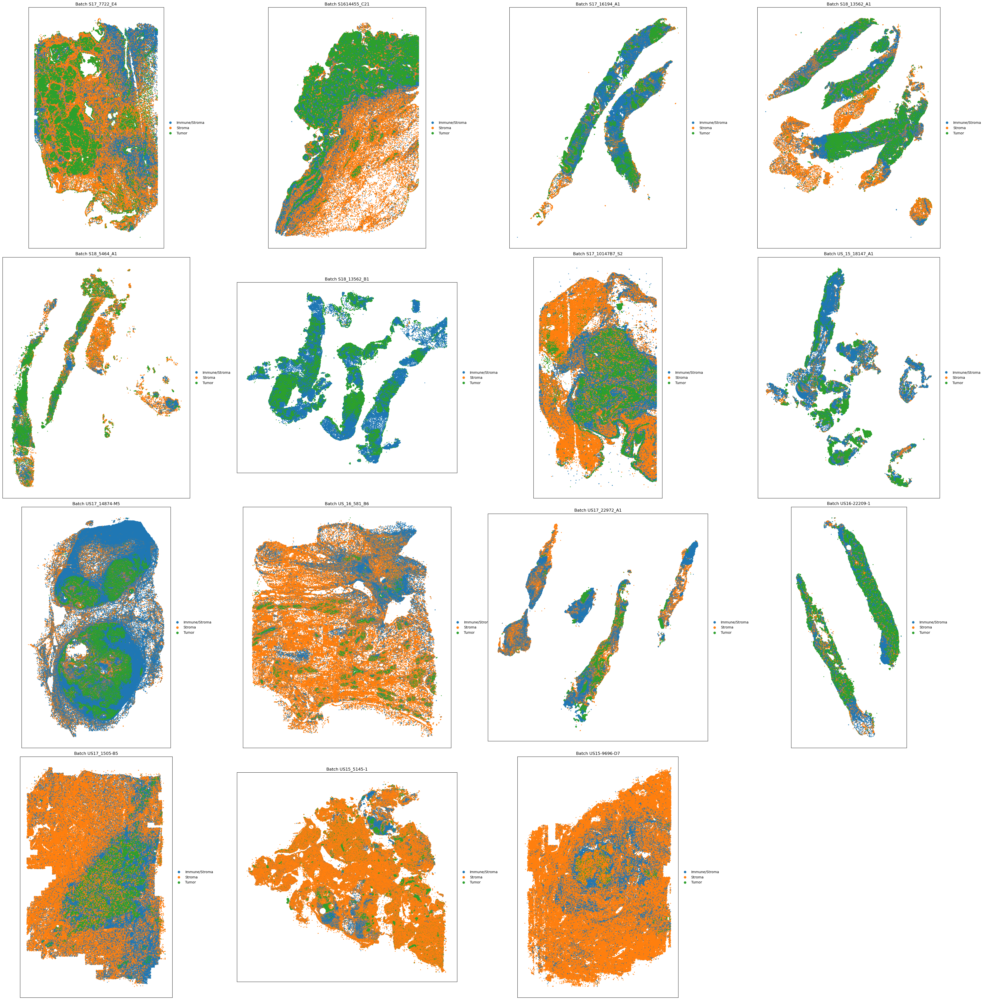

In [19]:
def clusterMap(adata, color='leiden', ax=None):
    sc.pl.embedding(adata, "spatial", color=color, s=20, ax=ax, show=False)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_aspect('equal')
    ax.set_facecolor('white')

# conduct clustering and generate dotplot
# st.pp.scale(adata)
sc.pl.dotplot(adata, adata.var_names.to_list(), groupby='phenotype', dendrogram=True, log=True, cmap='RdBu_r')
# Get unique batches
batches = adata.obs['batch'].unique()

# Determine the grid size
num_batches = len(batches)
grid_size = (4, 4)  # Adjust this based on the number of batches and your preference

fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(40, 40))

# Loop through the batches and create subplots
for i, batch in enumerate(batches):
    row = i // grid_size[1]
    col = i % grid_size[1]
    ax = axes[row, col]
    clusterMap(adata[adata.obs['batch'] == batch], color='phenotype', ax=ax)
    ax.set_title(f'Batch {batch}')

# Turn off axes for any remaining empty subplots
for j in range(num_batches, grid_size[0] * grid_size[1]):
    row = j // grid_size[1]
    col = j % grid_size[1]
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

In [14]:
adata[adata.obs['phenotype']=='Tumor'].write_h5ad('adata_tumor.h5ad')
adata[adata.obs['phenotype']!='Tumor'].write_h5ad('adata_stroma.h5ad')

In [15]:
print(adata[adata.obs['phenotype']!='Tumor'])
print(adata[adata.obs['phenotype']=='Tumor'])

View of AnnData object with n_obs × n_vars = 5561939 × 65
    obs: 'imagecol', 'imagerow', 'cellSize', 'batch', 'phenotype'
    var: 'mean', 'std'
    uns: 'spatial'
    obsm: 'spatial'
View of AnnData object with n_obs × n_vars = 2942564 × 65
    obs: 'imagecol', 'imagerow', 'cellSize', 'batch', 'phenotype'
    var: 'mean', 'std'
    uns: 'spatial'
    obsm: 'spatial'
